<a href="https://colab.research.google.com/github/anubhavshrestha/Machine-Learning/blob/main/Multiclass_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from torchvision import datasets
import torchvision.transforms as transforms
import collections
import torchsummary
from torchvision import utils
from torch.utils.data import DataLoader
from torchvision import models
from torchsummary import summary
from torch import nn
from torch import optim
from torch.optim.lr_scheduler import CosineAnnealingLR
import torch
%matplotlib inline
import os
from sklearn.model_selection import StratifiedShuffleSplit
from torch.utils.data import Subset
import copy
from torch.utils.tensorboard import SummaryWriter

!pip install tensorboard
!pip install torch torchvision


print(os.getcwd())
path = '/kaggle/working/data'
if not os.path.exists(path):
    os.makedirs(path)


/content


In [4]:
''' 1. Training STL-10 Dataset '''
# Fetch the data & convert numpy to pytorch tensor format

transf = transforms.Compose([transforms.ToTensor()])
train_ds = datasets.STL10(path,download=True,
                          split='train',
                          transform=transf)

''' 2. Test / Evaluation STL-10 Dataset '''

test_all = datasets.STL10(path,
                          download=True,
                          split='test',
                          transform=transf)

100%|██████████| 2640397119/2640397119 [00:48<00:00, 53953508.45it/s]


Extracting /kaggle/working/data/stl10_binary.tar.gz to /kaggle/working/data
Files already downloaded and verified


In [5]:
print(type(train_ds))
print(type(train_ds.data))

print(type(test_all))
print(type(test_all.data))

<class 'torchvision.datasets.stl10.STL10'>
<class 'numpy.ndarray'>
<class 'torchvision.datasets.stl10.STL10'>
<class 'numpy.ndarray'>


In [6]:
print(f'Shape of training set: {train_ds.data.shape}')
print(f'Shape of test set: {test_all.data.shape}')  # both evaluation & test sets

Shape of training set: (5000, 3, 96, 96)
Shape of test set: (8000, 3, 96, 96)


In [7]:
# Count the number of images per category
y_train = [y for _,y in train_ds]           #corresponding labels for training
counter_train = collections.Counter(y_train)
print('Class Image Counter for Training Data')
print(counter_train,'\n')

# Count the number of images per category
y_testall = [y for _,y in test_all]         #corresponding labels for testing
counter_testall = collections.Counter(y_testall)
print('Class Image Counter for Test Data')
print(counter_testall)

Class Image Counter for Training Data
Counter({1: 500, 5: 500, 6: 500, 3: 500, 9: 500, 7: 500, 4: 500, 8: 500, 0: 500, 2: 500}) 

Class Image Counter for Test Data
Counter({6: 800, 7: 800, 5: 800, 0: 800, 3: 800, 1: 800, 4: 800, 9: 800, 2: 800, 8: 800})


In [8]:
''' Stratified Shuffle Splitting '''
# using stratified splitting of classes
# this helps to balance out number of classes in validation and testing datasets

split = StratifiedShuffleSplit(n_splits=1,
                               test_size=0.2,
                               random_state=0)

indices = list(range(len(test_all))) # make index list for upto max value
y_test0 = [y for _,y in test_all]    # extract list of all class index

''' Validation / Test Split Index '''

print('Validation / Test Split Index:')
#iterable object so can only access it by iterating
for idx_test,idx_val in split.split(indices,y_test0):
    print("Test Indicies:", idx_test)
    print("Validation Indicies:", idx_val)
    print(len(idx_val),len(idx_test))

Validation / Test Split Index:
Test Indicies: [2096 4321 2767 ... 3206 3910 2902]
Validation Indicies: [6332 6852 1532 ... 5766 4469 1011]
1600 6400


In [9]:
''' Create two datasets from test_all '''
# use torch utility to make subsets for test_all

val_ds = Subset(test_all,
                idx_val)  # list of indicies for valid split
test_ds = Subset(test_all,
                 idx_test) # list of indicies for test split

''' Recount the number of images per class (similar to training data)'''

y_test = [y for _,y in test_ds]
y_val = [y for _,y in val_ds]

counter_test = collections.Counter(y_test)
counter_val = collections.Counter(y_val)
print(counter_test)
print(counter_val)

Counter({6: 640, 0: 640, 4: 640, 5: 640, 9: 640, 2: 640, 3: 640, 1: 640, 7: 640, 8: 640})
Counter({2: 160, 8: 160, 3: 160, 6: 160, 4: 160, 1: 160, 5: 160, 9: 160, 0: 160, 7: 160})


In [10]:
print(type(train_ds))
print(type(val_ds))
print(type(test_ds))

<class 'torchvision.datasets.stl10.STL10'>
<class 'torch.utils.data.dataset.Subset'>
<class 'torch.utils.data.dataset.Subset'>


In [11]:
def plot_img(img,y=None,color=True):
  '''plots the image with corresponding label'''
  npimg = img.numpy()
  npimg_T = np.transpose(npimg,(1,2,0))
  plt.imshow(npimg_T)
  plt.title(f'Label:{y}')
  plt.axis('on')

# Plot PyTorch Tensor Samples
def plot_tensor(tensor,random_id=False,class_id=None):
    '''sample a tensor in respect to corresponding class'''

    if(random_id is True):
        rnd_inds = np.random.randint(0,len(tensor),100)
        X_show = [tensor[i][0] for i in rnd_inds]
        target = [tensor[i][1] for i in rnd_inds]
    else:

        if(class_id is None):
            X_show = []
            # cycle through all classes
            for j in range(0,10):
                ii=-1
                for i in range(0,1000):
                    if(tensor[i][1] is j):
                        ii+=1
                        if(ii>19):
                            break
                        else:
                            X_show.append(tensor[i][0])

        if(class_id is not None):

            print(f'Showing samples from {len(tensor)} tensors:')

            X_show = []
            ii=-1
            for i in range(0,1000):
                if(tensor[i][1] is class_id):
                    ii+=1
                    if(ii>19):
                        break
                    else:
                        X_show.append(tensor[i][0])


    X_grid = utils.make_grid(X_show,nrow=20,padding=1)
    plt.figure(figsize=(30,10))
    plot_img(X_grid,y=None,color=True)

2


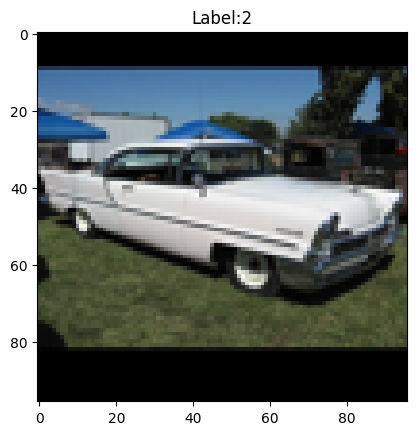

In [12]:
image, label = next(iter(val_ds))
plot_img(image, y = label)
print(label)

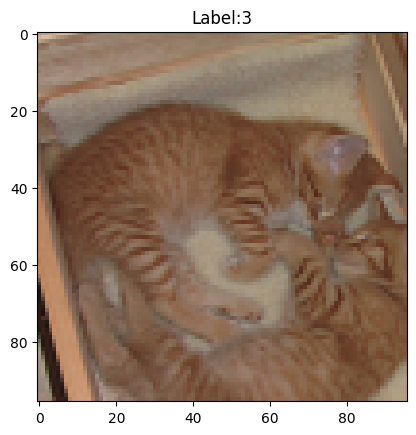

In [13]:
#plotting another image from validation dataset
val_datas = iter(val_ds)
for i in range(3):
  image, label = next(val_datas)
plot_img(image, y = label)


Showing samples from 5000 tensors:


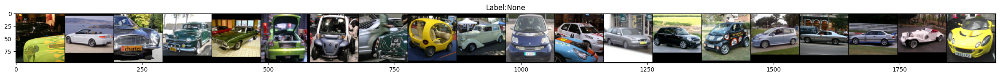

In [14]:
plot_tensor(train_ds, class_id = 2)

In [15]:
def get_meanstd(data):

    # list of lists of mean values for each image
    meanRGB = [np.mean(x.numpy(),axis=(1,2)) for x,_ in data]
    stdRGB = [np.std(x.numpy(),axis=(1,2)) for x,_ in data]
    print('Mean & std values for sample:')
    print(meanRGB[0]); print(stdRGB[0])

    # global dataset mean of those means
    meanR = np.mean([m[0] for m in meanRGB])
    meanG = np.mean([m[1] for m in meanRGB])
    meanB = np.mean([m[2] for m in meanRGB])

    # global dataset standard deviation mean
    stdR = np.mean([s[0] for s in stdRGB])
    stdG = np.mean([s[1] for s in stdRGB])
    stdB = np.mean([s[2] for s in stdRGB])

    print('\nMean value for dataset:')
    print(f'Mean Values: {meanR} {meanG} {meanB}')
    print(f'STD Values: {stdR} {stdG} {stdB}')

    return [meanR,meanG,meanB],[stdR,stdG,stdB]

means,stds = get_meanstd(train_ds)

Mean & std values for sample:
[0.5199615  0.47785485 0.34138668]
[0.12017056 0.12164892 0.10806711]

Mean value for dataset:
Mean Values: 0.44671058654785156 0.4398098587989807 0.4066464602947235
STD Values: 0.22414584457874298 0.2214890569448471 0.2238997519016266


Showing samples from 5000 tensors:


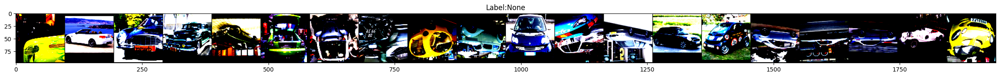

In [16]:
''' Define the image transformations ( for train_ds & test_all) '''

# Transformations for training set
train_transformer = transforms.Compose([transforms.RandomHorizontalFlip(p=0.5),
                                        transforms.RandomVerticalFlip(p=0.5),
                                        transforms.ToTensor(),
                                        transforms.Normalize([means[0],means[1],means[2]],
                                                             [stds[0],stds[1],stds[2]])])

# Standard transformations for test set
test0_transformer = transforms.Compose([transforms.ToTensor(),
                                        transforms.Normalize([means[0],means[1],means[2]],
                                                             [stds[0],stds[1],stds[2]])])

''' Update the transform functions for train_ds & test_all '''
train_ds.transform = train_transformer
test_all.transform = test0_transformer        # changes val_ds and test_ds due to shallow copy

plot_tensor(train_ds,class_id=2)      # after transformation

In [17]:
train_dl = DataLoader(train_ds,
                      batch_size=32,
                      shuffle=True)

# Create Data Loader (validation)
val_dl = DataLoader(val_ds,
                    batch_size=64,
                    shuffle=False)

test_dl = DataLoader(test_ds, batch_size = 64, shuffle = False)

In [18]:
#NON subscriptable object
for image, label in train_dl:
  print("TRAINING SHAPES: ")
  print(image.shape)
  print(label.shape)
  break
print()
for image, label in val_dl:
  print("VALIDATION SHAPES: ")
  print(image.shape)
  print(label.shape)
  break

TRAINING SHAPES: 
torch.Size([32, 3, 96, 96])
torch.Size([32])

VALIDATION SHAPES: 
torch.Size([64, 3, 96, 96])
torch.Size([64])


In [19]:
device = torch.device("cuda:0")

'''Non-pretrained resnet model'''
model_resnet18 = models.resnet18(pretrained=False)
num_ftrs = model_resnet18.fc.in_features
model_resnet18.fc = nn.Linear(num_ftrs,10)


''' Pretrained Model Variant '''
pre_resnet18 = models.resnet18(pretrained=True)
num_ftrs = pre_resnet18.fc.in_features
pre_resnet18.fc = nn.Linear(num_ftrs,10)



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache

In [20]:
def get_summary_writer(model_name):
    log_dir = f"runs/{model_name}"
    return SummaryWriter(log_dir=log_dir)

def get_lr(opt):
    for param_group in opt.param_groups:
        return param_group['lr']
''' Define an optimiser '''
optimiser= optim.Adam(model_resnet18.parameters(),
                 lr=1e-4)

current_lr = get_lr(optimiser)
print(f'current lr = {current_lr}')

''' Define learning rate scheduler '''
lr_scheduler = CosineAnnealingLR(optimiser,
                                 T_max=2,
                                 eta_min=1e-5)


In [21]:
#Training using own function
import torch.optim.lr_scheduler as lr_scheduler
losses = []
val_losses = []
def train(model,train_loader, val_loader,num_epochs = 10,learning_rate = 1e-4):
  model.to(device)
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)
  scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=5, eta_min = 1e-6)  # Using Cosine Annealing LR Scheduler
  patience = 5 #for early stopping
  best_val_loss = float("inf")        # initializing to inf to get lowest

  writer = get_summary_writer("pre_resnet18")

  for epoch in range(num_epochs):
      # Training
      model.train()
      train_loss = 0.0
      total_correct = 0
      total_samples = 0
      for batch_data, batch_labels in train_loader:

          batch_data, batch_labels = batch_data.to(device), batch_labels.to(device)
          outputs = model(batch_data)

          optimizer.zero_grad()
          loss = criterion(outputs, batch_labels)
          loss.backward()
          optimizer.step()
          train_loss += loss.item()

          _, predicted = torch.max(outputs, 1)            #getting corresponding labels
          total_samples += batch_labels.size(0)
          total_correct += (predicted == batch_labels).sum().item()

      train_loss /= len(train_loader)
      train_accuracy = 100.0 * total_correct / total_samples
      losses.append(train_loss)

      # Validation
      model.eval()
      val_loss = 0.0
      total_correct = 0
      total_samples = 0
      with torch.no_grad():
          for batch_data, batch_labels in val_loader:
              batch_data, batch_labels = batch_data.to(device), batch_labels.to(device)
              outputs = model(batch_data)
              loss = criterion(outputs, batch_labels)
              val_loss += loss.item()

              _, predicted = torch.max(outputs, 1)
              total_samples += batch_labels.size(0)
              total_correct += (predicted == batch_labels).sum().item()

      val_loss /= len(val_loader)
      val_accuracy = 100.0 * total_correct / total_samples
      val_losses.append(val_loss)

      # Print progress
      print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%")

      writer.add_scalar("Loss/Train", train_loss, epoch + 1)
      writer.add_scalar("Loss/Val", val_loss, epoch + 1)
      writer.add_scalar("Accuracy/Train", train_accuracy, epoch + 1)
      writer.add_scalar("Accuracy/Val", val_accuracy, epoch + 1)

      scheduler.step()  # Update learning rate with Cosine Annealing LR Scheduler


      if val_loss < best_val_loss:
          best_val_loss = val_loss
          epochs_without_improvement = 0
      else:
          epochs_without_improvement += 1

      if epochs_without_improvement >= patience:
          print(f"Early stopping at epoch {epoch+1}. Best validation loss: {best_val_loss:.4f}")
          break
  writer.close()

In [22]:
losses = []
val_losses = []
train(model_resnet18, train_dl, val_dl, 10, 1e-4) #ran for multiple epochs before as well. plotting the recent 8

Epoch 1/10, Train Loss: 1.7640, Val Loss: 1.5568, Train Accuracy: 33.24%, Val Accuracy: 42.00%
Epoch 2/10, Train Loss: 1.4315, Val Loss: 1.5059, Train Accuracy: 46.76%, Val Accuracy: 41.88%
Epoch 3/10, Train Loss: 1.2199, Val Loss: 1.3683, Train Accuracy: 55.76%, Val Accuracy: 50.75%
Epoch 4/10, Train Loss: 1.0303, Val Loss: 1.3093, Train Accuracy: 63.48%, Val Accuracy: 51.12%
Epoch 5/10, Train Loss: 0.9034, Val Loss: 1.2506, Train Accuracy: 69.08%, Val Accuracy: 54.12%
Epoch 6/10, Train Loss: 0.8447, Val Loss: 1.2427, Train Accuracy: 72.72%, Val Accuracy: 54.50%
Epoch 7/10, Train Loss: 0.8350, Val Loss: 1.2506, Train Accuracy: 72.40%, Val Accuracy: 54.38%
Epoch 8/10, Train Loss: 0.8212, Val Loss: 1.2845, Train Accuracy: 72.48%, Val Accuracy: 53.38%
Epoch 9/10, Train Loss: 0.8435, Val Loss: 1.3810, Train Accuracy: 71.54%, Val Accuracy: 51.88%
Epoch 10/10, Train Loss: 0.8558, Val Loss: 1.4923, Train Accuracy: 70.20%, Val Accuracy: 49.31%


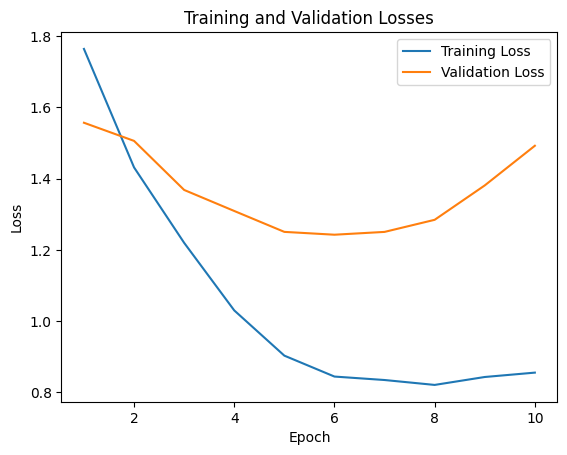

In [23]:
training_epoch = 10
# Plotting the losses and validation losses
plt.plot(range(1, training_epoch+1), losses, label="Training Loss")
plt.plot(range(1, training_epoch+1), val_losses, label="Validation Loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()

In [24]:
losses = []
val_losses = []
train(pre_resnet18, train_dl, val_dl, 10, 1e-4)

Epoch 1/10, Train Loss: 0.9024, Val Loss: 0.4397, Train Accuracy: 69.38%, Val Accuracy: 85.00%
Epoch 2/10, Train Loss: 0.4346, Val Loss: 0.3744, Train Accuracy: 85.34%, Val Accuracy: 86.31%
Epoch 3/10, Train Loss: 0.2994, Val Loss: 0.3619, Train Accuracy: 90.20%, Val Accuracy: 87.12%
Epoch 4/10, Train Loss: 0.2021, Val Loss: 0.3233, Train Accuracy: 93.94%, Val Accuracy: 88.69%
Epoch 5/10, Train Loss: 0.1588, Val Loss: 0.3120, Train Accuracy: 95.42%, Val Accuracy: 88.62%
Epoch 6/10, Train Loss: 0.1408, Val Loss: 0.3187, Train Accuracy: 96.18%, Val Accuracy: 88.50%
Epoch 7/10, Train Loss: 0.1525, Val Loss: 0.3079, Train Accuracy: 95.52%, Val Accuracy: 89.25%
Epoch 8/10, Train Loss: 0.1402, Val Loss: 0.3214, Train Accuracy: 95.82%, Val Accuracy: 88.12%
Epoch 9/10, Train Loss: 0.1429, Val Loss: 0.3913, Train Accuracy: 95.82%, Val Accuracy: 87.19%
Epoch 10/10, Train Loss: 0.1540, Val Loss: 0.3921, Train Accuracy: 95.30%, Val Accuracy: 86.88%


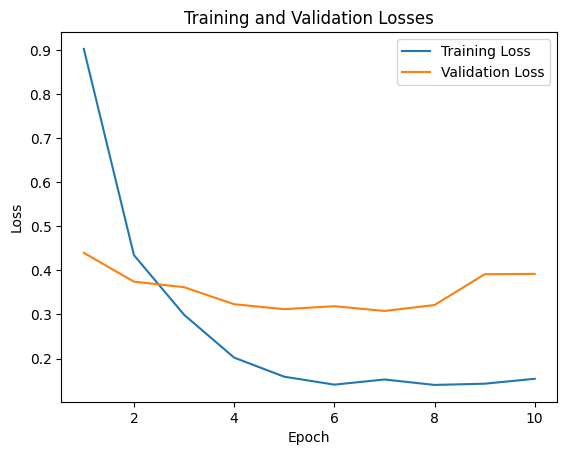

In [25]:
training_epoch = 10
# Plotting the losses and validation losses
plt.plot(range(1, training_epoch+1), losses, label="Training Loss")
plt.plot(range(1, training_epoch+1), val_losses, label="Validation Loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()

In [26]:
def test(model, test_loader):
    model.eval()
    criterion = nn.CrossEntropyLoss()
    test_loss = 0.0
    total_correct = 0
    total_samples = 0

    with torch.no_grad():
        for batch_data, batch_labels in test_loader:
            batch_data, batch_labels = batch_data.to(device), batch_labels.to(device)
            outputs = model(batch_data)
            loss = criterion(outputs, batch_labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total_samples += batch_labels.size(0)
            total_correct += (predicted == batch_labels).sum().item()

    test_loss /= len(test_loader)
    test_accuracy = 100.0 * total_correct / total_samples

    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%")


In [27]:
#Non-pretained resnet18 model
test(model_resnet18, test_dl)

Test Loss: 1.4977, Test Accuracy: 49.92%


In [28]:
#Pretrained resnet18 model
test(pre_resnet18, test_dl)

Test Loss: 0.4000, Test Accuracy: 87.25%


In [29]:
def round(x):
  _, max = torch.max(x, dim = 1)
  return labels_values[max.item()]
labels_values = {0:"Aircraft", 1:"Bird", 2: "Automobile", 3: "Cat", 4:"Deer", 5:"Dogs", 6:"Horse", 7:"Monkey", 8:"Ship", 9:"Truck"
}

In [30]:
#visualizing
def predict(model,x, new_image = False): #new image are those images that do not require permutations
  model.eval()

  if len(x.shape) == 3:
    x = x.unsqueeze(0)        # for predicting single picture
  if not new_image:
    x = x.permute(0, 3, 1, 2)

  x = x.to(device)

  pred = model(x)
  return round(pred)

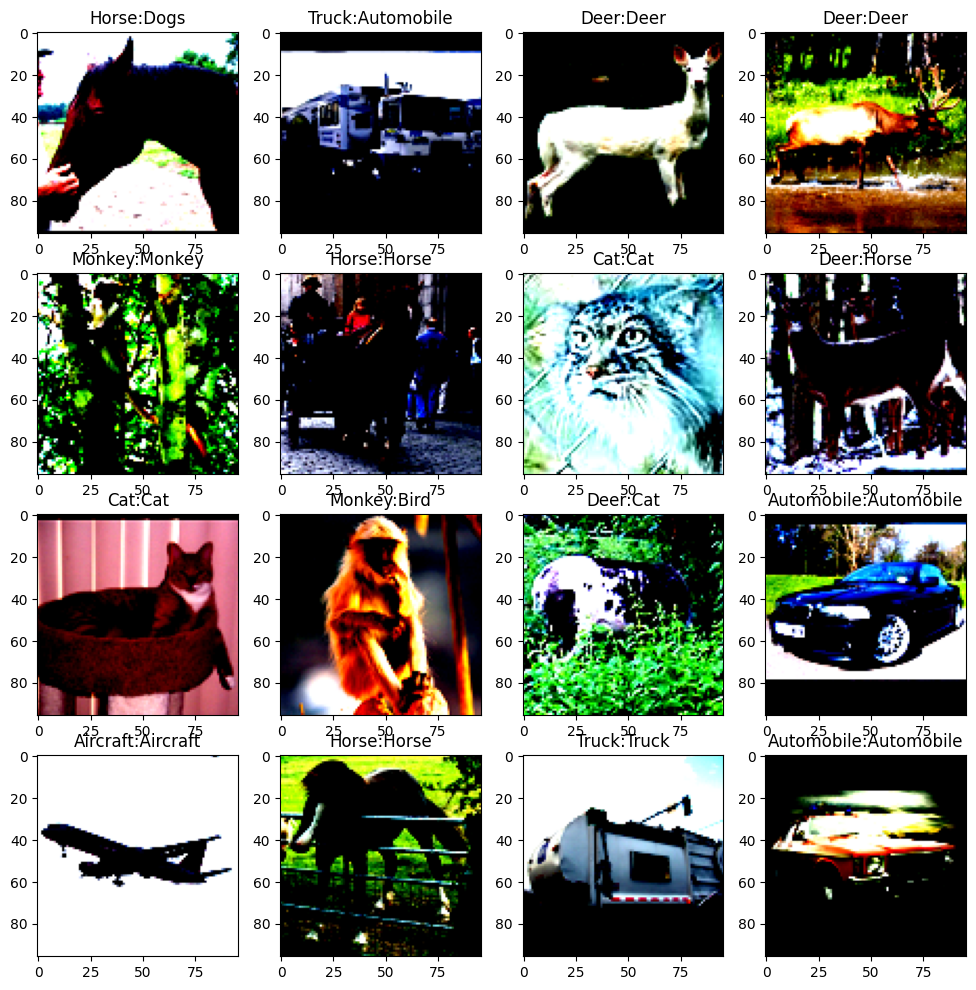

In [31]:
#visualizing the results
#MODEL NON PRETRAINED RESNET

import random
count = 0
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
for i in range(1,17):
  random_index = random.randint(0, len(test_ds)-1)
  random_image = test_ds[random_index][0].to(device)
  label = test_ds[random_index][1]
  model_answer = predict(model_resnet18, random_image, new_image = True)
  ax = plt.subplot(4, 4, i)

  random_image = random_image.cpu().numpy().transpose((1, 2, 0))
  plt.imshow(random_image)
  plt.title(labels_values[label] + ":" + str(model_answer))

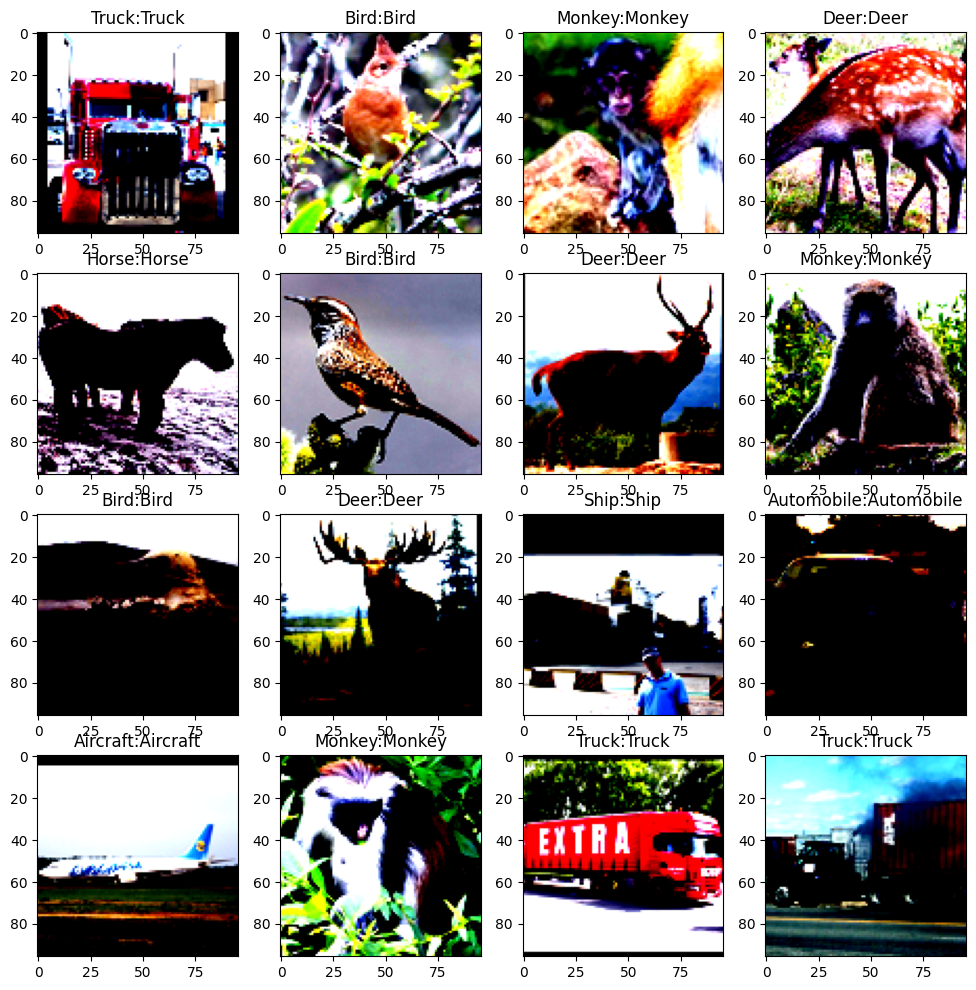

In [32]:
#visualizing the results
#MODEL PRETRAINED RESNET

import random
count = 0
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
for i in range(1,17):
  random_index = random.randint(0, len(test_ds)-1)
  random_image = test_ds[random_index][0].to(device)
  label = test_ds[random_index][1]
  model_answer = predict(pre_resnet18, random_image, new_image = True)
  ax = plt.subplot(4, 4, i)

  random_image = random_image.cpu().numpy().transpose((1, 2, 0))
  plt.imshow(random_image)
  plt.title(labels_values[label] + ":" + str(model_answer))

In [33]:
from google.colab import drive
drive.mount('/content/drive')
save_path = "/content/drive/My Drive/Colab Notebooks/pre_resnet_model.pt"
# Save the model checkpoint
torch.save(pre_resnet18.state_dict(), save_path)

Mounted at /content/drive


In [44]:
#making a Confusion Matrix for test predictions


from sklearn.metrics import confusion_matrix
test_loader = DataLoader(test_ds, batch_size = 32)

pre_resnet18.eval()
all_predictions = []
all_targets = []

with torch.no_grad():
    for m in test_ds:
        test_x = m[0].unsqueeze(0).to(device)
        test_y = m[1]


        test_pred = pre_resnet18(test_x)

        # Get the predicted class by taking the index of the maximum value in each prediction
        _, predicted_class = torch.max(test_pred, dim=1)

        all_predictions.extend(predicted_class.tolist())
        all_targets.append(test_y)

# Convert lists to torch tensors
all_predictions = torch.tensor(all_predictions)
all_targets = torch.tensor(all_targets)

# Calculate the confusion matrix
cm = confusion_matrix(all_targets, all_predictions)

# Print the confusion matrix
print("Confusion Matrix:")
print(cm)
print("Total data = ", len(test_loader)* 32)

Confusion Matrix:
[[601   2   3   1   1   1   3   0  22   6]
 [  7 567   1  22   7  14   3  17   2   0]
 [ 11   1 587   1   0   2   0   0   3  35]
 [  0  14   0 497  33  58   6  31   1   0]
 [  1   8   1  33 530  28  25  13   1   0]
 [  1  10   0  36  15 527  25  23   2   1]
 [  2   3   1  11  18  60 532   6   1   6]
 [  1  12   0  33   8  21   3 561   0   1]
 [ 13   0   2   3   0   0   0   0 610  12]
 [ 22   2  15   1   0   1   0   0  27 572]]
Total data =  6400


In [45]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>